In [2]:
%load_ext autoreload
%autoreload 2

import sys, os, pickle, time, warnings
import numpy as np, pandas as pd, scipy, scipy.stats as stats, tqdm, h5py
from copy import deepcopy as copy

# Plotting modules
import matplotlib, corner
from pylab import cm
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

In [3]:
# Plotting modules
font = {'family' : 'serif', 'weight' : 'normal',
        'size'   : 16}
legend = {'fontsize': 16}
matplotlib.rc('font', **font)
matplotlib.rc('legend', **legend)
plt.rc('text', usetex=True)
plt.rc('axes', labelsize=16)
plt.rc('xtick',labelsize=16)
plt.rc('ytick',labelsize=16)
plt.rc('legend',fontsize=16)

cm_default = plt.rcParams['axes.prop_cycle'].by_key()['color']

corner_kwargs = {'max_n_ticks':3, 'title_kwargs':{"fontsize": 16}, 'label_kwargs':{'fontsize':16}}

In [4]:
sys.path.extend(['../utilities/', '../models/'])
import samplers, disk_cone_plcut as dcp, plotting, transformations
from transformations import func_inv_jac, func_labels, label_dict

# Load fits from Saved File

In [68]:
chains = {}; true_pars = {}; param_trans={}; free_pars={}
with h5py.File("/data/asfe2/Projects/mwtrace_data/mockmodel/fits_allcmpt_p14_rndst.h", 'r') as hf:
    for key in hf['chain'].keys():
        chains[key]=hf['chain'][key][...]
    for par in hf['true_pars'].keys():
        try: true_pars[par]=hf['true_pars'][par][...]
        except AttributeError:
            true_pars[par]={}
            for par2 in hf['true_pars'][par].keys():
                true_pars[par][par2]=hf['true_pars'][par][par2][...]
    for cmpt in hf['param_trans'].keys():
        param_trans[cmpt]={}
        for par in hf['param_trans'][cmpt].keys():
            param_trans[cmpt][par]=hf['param_trans'][cmpt][par][...].astype(str).tolist()
            for ii in range(1,5): param_trans[cmpt][par][ii]=float(param_trans[cmpt][par][ii])
    for cmpt in hf['free_pars'].keys():
        free_pars[cmpt]=np.array(hf['free_pars'][cmpt][...].astype(str))
        
true_params=[]; params_i = 0
for cmpt in np.arange(3).astype(str).tolist()+['shd',]:
    for par in free_pars[cmpt]:
        try: 
            true_params+=[func_inv_jac[param_trans[cmpt][par][0]](*param_trans[cmpt][par][1:3])[1](true_pars[cmpt][par]),]
        except KeyError: 
            true_params+=[func_inv_jac[param_trans[cmpt][par][0]](*param_trans[cmpt][par][1:3])[1](true_pars[par]),]
        params_i += 1;
true_params=np.array(true_params)

labels=[]; params_i = 0
for cmpt in np.arange(3).astype(str).tolist()+['shd',]:
    for par in free_pars[cmpt]:
        labels+=[func_labels[param_trans[cmpt][par][0]](label_dict[par], *param_trans[cmpt][par][1:3]),]
        params_i += 1;

# 8 parameter fit, hot start
/data/asfe2/Projects/mwtrace_data/mockmodel/fits_allcmpt_p8.h

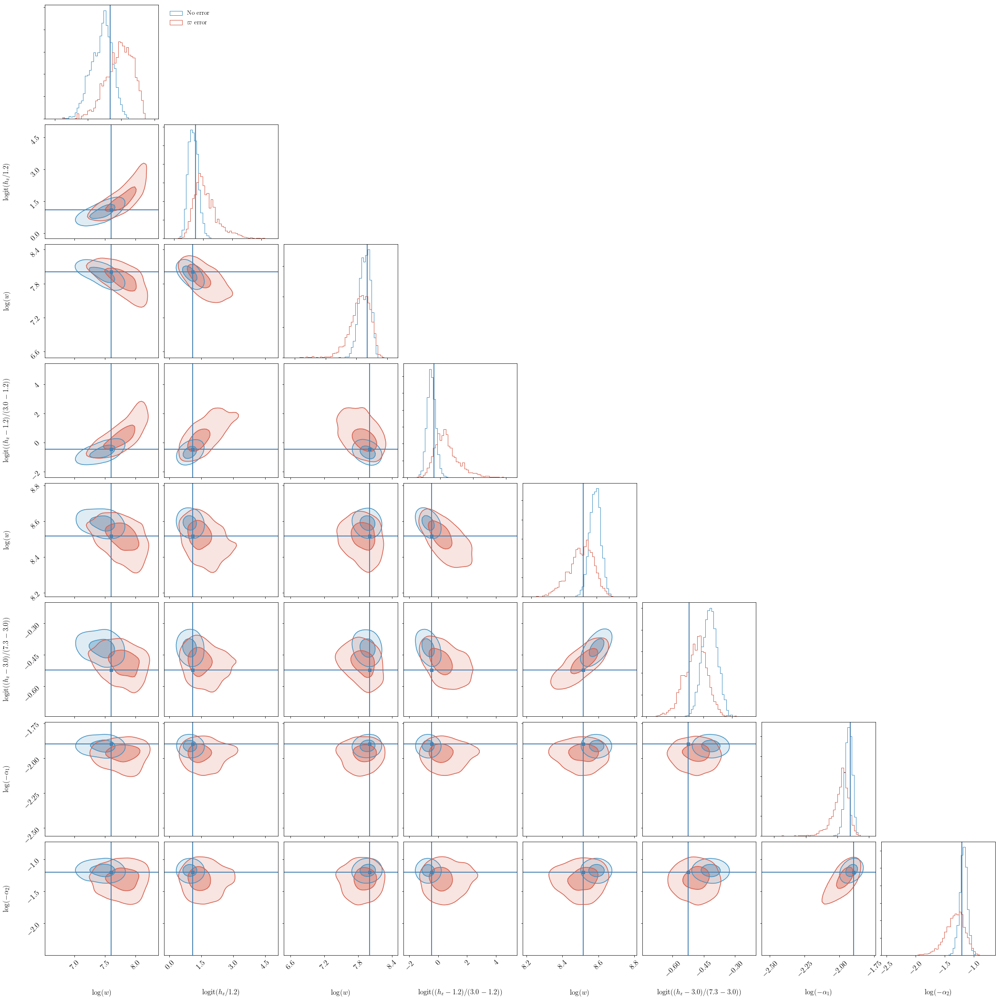

In [65]:
index = ['No error', r'$\varpi$ error']
ndim=len(labels); fig, axes = plt.subplots(ndim,ndim, figsize=(30,30))
plotting.layered_corners([chains['full_noerr'], chains['full_perr']], index=index, truths=true_params, labels=labels,
                         colors=[cm.RdBu(0.8), cm.RdBu(0.2)], fig=fig, ax=axes)

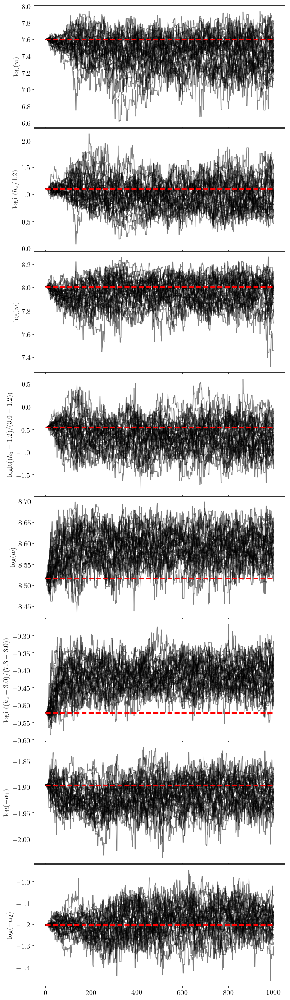

In [66]:
plotting.plot_chains(chains['full_noerr'], truths=true_params, labels=labels)

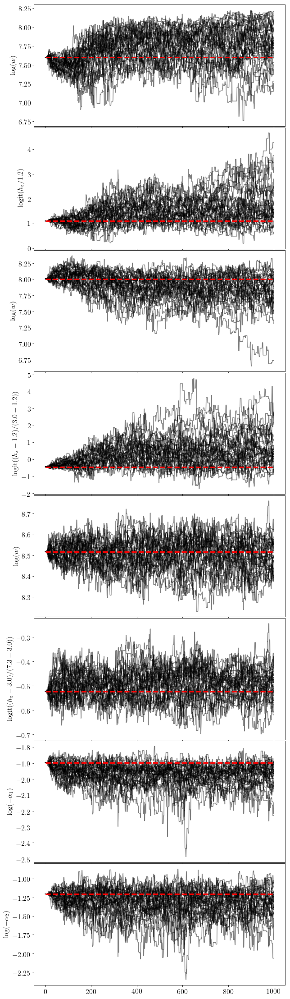

In [67]:
plotting.plot_chains(chains['full_perr'], truths=true_params, labels=labels)

# 14 Parameter fit, hot start

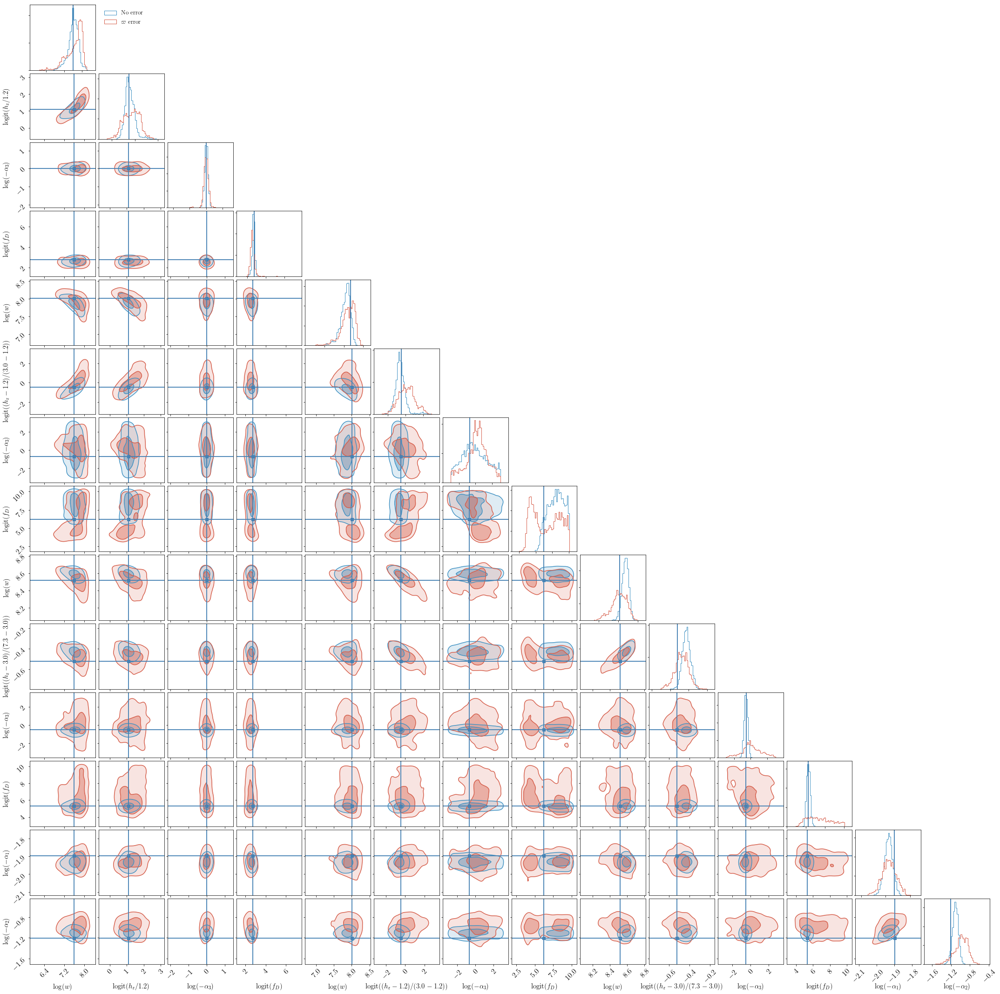

In [61]:
index = ['No error', r'$\varpi$ error']
ndim=len(labels); fig, axes = plt.subplots(ndim,ndim, figsize=(30,30))
plotting.layered_corners([chains['full_noerr'], chains['full_perr']], index=index, truths=true_params, labels=labels,
                         colors=[cm.RdBu(0.8), cm.RdBu(0.2)], fig=fig, ax=axes)

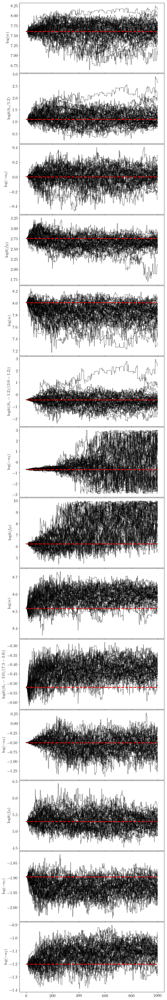

In [62]:
plotting.plot_chains(chains['full_noerr'], truths=true_params, labels=labels)

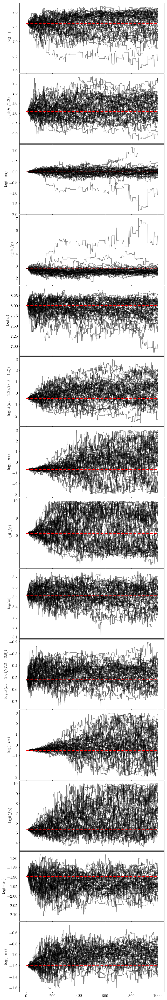

In [63]:
plotting.plot_chains(chains['full_perr'], truths=true_params, labels=labels)

# 14 component fit rand start

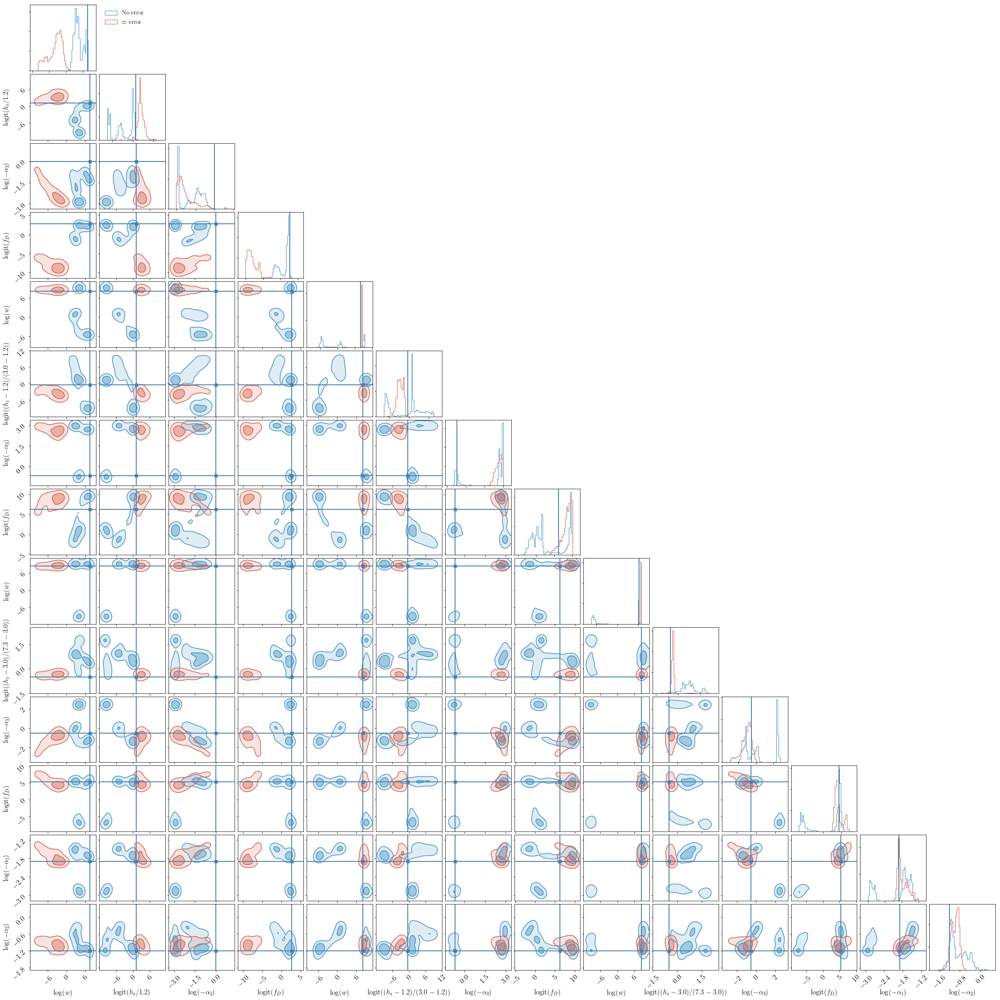

In [69]:
index = ['No error', r'$\varpi$ error']
ndim=len(labels); fig, axes = plt.subplots(ndim,ndim, figsize=(30,30))
plotting.layered_corners([chains['full_noerr'], chains['full_perr']], index=index, truths=true_params, labels=labels,
                         colors=[cm.RdBu(0.8), cm.RdBu(0.2)], fig=fig, ax=axes)

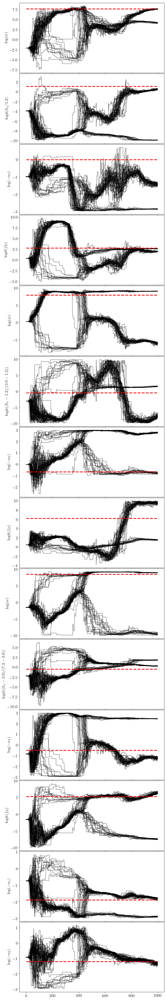

In [70]:
plotting.plot_chains(chains['full_noerr'], truths=true_params, labels=labels)

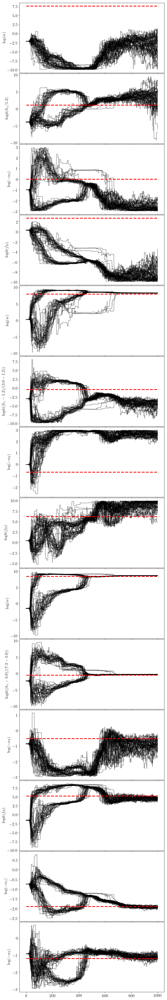

In [71]:
plotting.plot_chains(chains['full_perr'], truths=true_params, labels=labels)

# Test runs

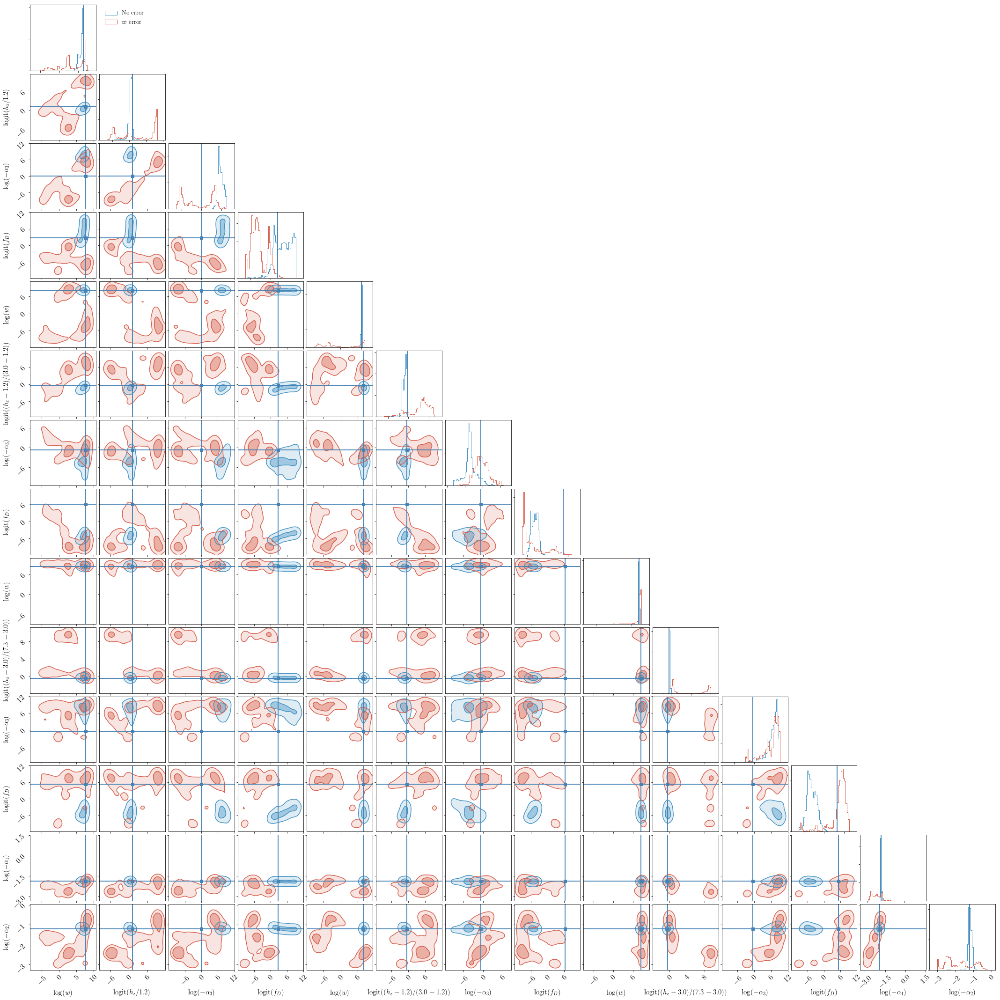

In [26]:
index = ['No error', r'$\varpi$ error']
ndim=len(labels); fig, axes = plt.subplots(ndim,ndim, figsize=(30,30))
plotting.layered_corners([chains['full_noerr'], chains['full_perr']], index=index, truths=true_params, labels=labels,
                         colors=[cm.RdBu(0.8), cm.RdBu(0.2)], fig=fig, ax=axes)

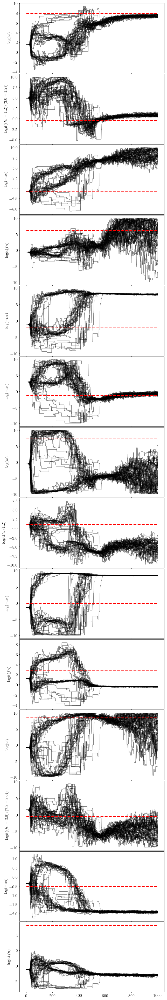

In [19]:
plotting.plot_chains(chains['full_noerr'], truths=true_params, labels=labels)

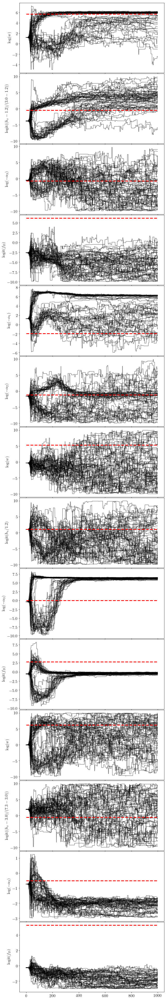

In [15]:
plotting.plot_chains(chains['full_perr'], truths=true_params, labels=labels)

In [43]:
# Load Sample
size = 10000
sample = {}; true_pars={}; latent_pars={};
filename = '/data/asfe2/Projects/mwtrace_data/mockmodel/sample.h'
with h5py.File(filename, 'r') as hf:
    #subset = (hf['sample']['M'][...]>hf['true_pars'][str(cmpt)]['Mto'][...])
    subsample  = np.sort(np.random.choice(np.arange(len(hf['sample']['source_id'])), size=size, replace=False))
    for key in hf['sample'].keys():
        sample[key]=hf['sample'][key][...][subsample]
    # Get true parameters
    for key in hf['true_pars'].keys():
        if not key in np.arange(3).astype(str):
            true_pars[key]=hf['true_pars'][key][...]
        else:
            true_pars[int(key)]={}
            for par in hf['true_pars'][key].keys():
                true_pars[int(key)][par]=hf['true_pars'][key][par][...]
for j in range(3): true_pars[j]['w']*=size

In [45]:
i=0
print(np.sum((sample['cmpt']==i)&(sample['M']<true_pars[i]['Mto'])))

true_pars[i]['w']*(1-true_pars[i]['fD'])

120


120.00000000000011

6.0

In [56]:
test_dict = {'a':1, 'b':2, 'c':3}
test_dict = dict(test_dict, **{'d':4, 'e':5})

In [50]:
test_dict

{'a': 1, 'b': 2, 'c': 3, 'd': 4, 'e': 5}

In [57]:
test_dict.remove('a')

AttributeError: 'dict' object has no attribute 'remove'

In [55]:
test_dict

{'b': 2, 'c': 3, 'd': 4, 'e': 5}

In [23]:
true_pars

{0: {'Mto': array(4.8),
  'alpha3': array(-1.),
  'fD': array(0.94),
  'hz': array(0.9),
  'w': array(2000.)},
 1: {'Mto': array(3.14),
  'alpha3': array(-0.5),
  'fD': array(0.998),
  'hz': array(1.9),
  'w': array(3000.)},
 2: {'Mto': array(3.3),
  'alpha3': array(-0.6),
  'fD': array(0.995),
  'hz': array(4.6),
  'w': array(5000.)},
 'Mms': array(8.),
 'Mms1': array(9.),
 'Mms2': array(7.),
 'Mx': array(10.7),
 'N': array(100000),
 'R0': array(8.27),
 'alpha1': array(-0.15),
 'alpha2': array(-0.3),
 'theta_deg': array(60)}